<center>
<img src="https://drive.google.com/uc?id=1HAU6t58ruCE-hX8M70x4vEXMbEPOJE8A" width=600 />
</center>

<div dir=rtl>

פרומפט לציפי: "צייר לי כיתה ללימוד אנגלית בישראל, המורה אבישי, נותן לתלמידים תרגיל ראשון באנגלית. על הקירות יש הסברים באנגלית ובעברית. "

------

## Setup

In [ ]:
!pip install -q openai                 # for gpt
!pip install -q -U google-generativeai # for gemeni

import os
import json
import re
import requests
from datetime import date

import pandas as pd
from PIL import Image, ImageFile

import textwrap

import io
from io import BytesIO

import openai
from openai import OpenAI

import google.generativeai as genai

from IPython.display import HTML, IFrame, Markdown

from google.colab import userdata

# for google sheet&doc api
from googleapiclient.discovery import build
from google.oauth2.service_account import Credentials

openai.api_key = userdata.get('openai_classgemeni')


# download credential json file
credfile = 'cred5.json'
!wget -O {credfile}  https://drive.google.com/uc?id=1txd_GpvPRzl7bMI878dm_XXHwB_cJASL


## Gemeni
google_api_key = userdata.get('GOOGLE_API_KEY').strip()
genai.configure(api_key=google_api_key)

model_pro = genai.GenerativeModel('gemini-1.5-pro')
model_flash = genai.GenerativeModel('gemini-1.5-flash')
model = model_pro

## OpenAI (GPT)
client = OpenAI(api_key=openai.api_key)


def gpt(prompt, model='gpt-4o'):
  chat_completion = client.chat.completions.create(
      messages=[
          {
              "role": "user",
              "content": prompt,
          }
      ],
      model=model,
  )

  return chat_completion.choices[0].message.content


def dalle_call(prompt, width=700):
  response = openai.Image.create(
    prompt=prompt,
    n=1,
    size="1024x1024"
  )
  url = response['data'][0]['url']
  html = HTML(f'<img src="{url}" width={width} />')
  display(html)

##

def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))


def split_text(text, interval=70):
  words = text.split(' ')
  i = 0
  ret = ''
  while True:
    s = ''
    while len(s) < interval:
      s += words[i] + ' '
      i += 1
      if i >= len(words):
        return ret + s
    ret += s + '\n'


def split_print(text, interval=70):
  print(split_text(text, interval))


def youtube(vid, width=600, height=600):
  src = 'https://www.youtube.com/embed/' + vid
  return IFrame(src, width, height)


ImageFile.LOAD_TRUNCATED_IMAGES = True


def convert_url(url):
  prefix = url[:url.find('open')]
  id = url[url.find('id=')+3:]
  return  prefix + 'uc?id=' + id


def display_image(url):
  response = requests.get(url)

  content_type = response.headers['Content-Type']

  if 'image' in content_type:
      img = Image.open(BytesIO(response.content))
      display(img)
  else:
      print(f"URL does not contain an image. Content-Type: {content_type}")

  # img = Image.open(BytesIO(response.content))
  # display(img)


def ocr_image(url, model='gpt-4o'): #"gpt-4o-mini"
  response = client.chat.completions.create(
    model = model,
    messages=[
      {
        "role": "user",
        "content": [
          {"type": "text", "text": "write the text which is written in this image"},
          {
            "type": "image_url",
            "image_url": {
              "url": url,
            },
          },
        ],
      }
    ],
    max_tokens=300,
  )

  return response.choices[0].message.content



template = '''
Evaluate the following text written by a 12th grader studying
English as a second language, be polite and encouraging use
the grading rubric described in the following
URL: https://meyda.education.gov.il/files/Pop/0files/english/Chativa-Elyona/Bagrut/FGExternalInternal2020.pdf

the text was written in response to the following question:
"How to choose a career?"

And this is the student's answer:
"{answer}"

'''

av_question1 = 'Write one page about your summer vacation'

template_av_1 = '''
Evaluate the following text written by a 12th grader studying
English as a second language, be polite and encouraging
the text was written in response to the following question:
"How to choose a career?"

And this is the student's answer:
"{answer}"

'''


def gpt_print_report(urls):
  for url in urls:
    וrl = convert_url(url)
    display_image(url)
    ocr = ocr_image(url)
    split_print(ocr)
    prompt = template.format(answer=ocr)
    r = gpt(prompt)
    split_print(r)
    print('='*80 + '\n'*3)


def download_images(urls, filetype='jpg'):
  filenames = []
  for i, url in enumerate(urls):
    filename = f'image{i}.' + filetype
    filenames.append(filename)
    !wget -q -O {filename} {url}
  return filenames

def load_images(filenames):
  images = []
  for filename in filenames:
    img = Image.open(filename)
    images.append(img)
    # display(img)
  return images


def formated_print(s):
  words = s.split(' ')
  s1 = ''
  i = 0
  n = 10
  while i < len(words):
    line = ' '.join(words[i:i+n])
    s1 += line + '\n'
    i += n
  print(s1)


def extract_content(images):
  texts = []
  for img in images:
    r = model_flash.generate_content(img)
    texts.append(r.text)
  return texts


def evaluate_answers(questions, answers):
  evals = []
  for question, answer in zip(questions, answers):
    prompt = template.format(question=question, answer=answer)
    r = model.generate_content(prompt)
    evals.append(r.text)
  return evals


def gemeni_print_report(images, answers, evals):
  for img, answer, eval in zip(images, answers, evals):
    display(img)
    ocr_count = len(answer.split(' '))
    formated_print(f'Answer ({ocr_count} words): {answer}\n')
    formated_print(f'Evaluation: {eval}\n')


def check_works(urls):
  filenames = download_images(urls)
  images = load_images(filenames)
  for img in images:
    display(img)

    try:
      r = model_flash.generate_content(img)
      ocr = r.text
      print('== OCR ==')
      formated_print(ocr)
    except Exception as e:
      print(e)
    print('\n')

    try:
      prompt = template_av_1.format(answer=ocr)
      r = model.generate_content(prompt)
      print('== Evaluation ==')
      formated_print(r.text)
    except Exception as e:
      print(e)

    print('='*80 + '\n'*3)


--2024-09-06 16:48:39--  https://drive.google.com/uc?id=1txd_GpvPRzl7bMI878dm_XXHwB_cJASL
Resolving drive.google.com (drive.google.com)... 172.217.0.78, 2607:f8b0:4025:815::200e
Connecting to drive.google.com (drive.google.com)|172.217.0.78|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1txd_GpvPRzl7bMI878dm_XXHwB_cJASL [following]
--2024-09-06 16:48:39--  https://drive.usercontent.google.com/download?id=1txd_GpvPRzl7bMI878dm_XXHwB_cJASL
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.217.0.65, 2607:f8b0:4025:810::2001
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.217.0.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2388 (2.3K) [application/octet-stream]
Saving to: ‘cred5.json’

cred5.json          100%[===================>]   2.33K  --.-KB/s    in 0s      

2024-09-06 16:48:41 (21.4 MB/s) - ‘cred5.json’ saved [2

## Read Google sheet

In [ ]:
# google sheet

# sheet_id = '1kAtICIJ4bvUB9ZC9YxU--Z4GNOryh9g0rJ9t-f2HEwo' # in shamir
sheet_id = '1uTzCn21Q1uTtZLmDGO19q0SsaMbjOeDMdlWbl9_8VhY'     # in classgemeni
worksheet_name = 'Sheet1'
creds = Credentials.from_service_account_file(credfile)

service = build('sheets', 'v4', credentials=creds)
sheet = service.spreadsheets()

sheet_vals = sheet.values().get(spreadsheetId=sheet_id, range=worksheet_name).\
                            execute()['values']
titles = sheet_vals[0]
sheet_vals = sheet_vals[1:]
urls = [convert_url(row[2]) for row in sheet_vals]
urls = urls[:2]
urls

['https://drive.google.com/uc?id=1CpLYrckyePRXCk05U0i7pvWbKj5fFP3q',
 'https://drive.google.com/uc?id=1AjdPupobytON2Tws81YIIdVKgG4eMFIF']

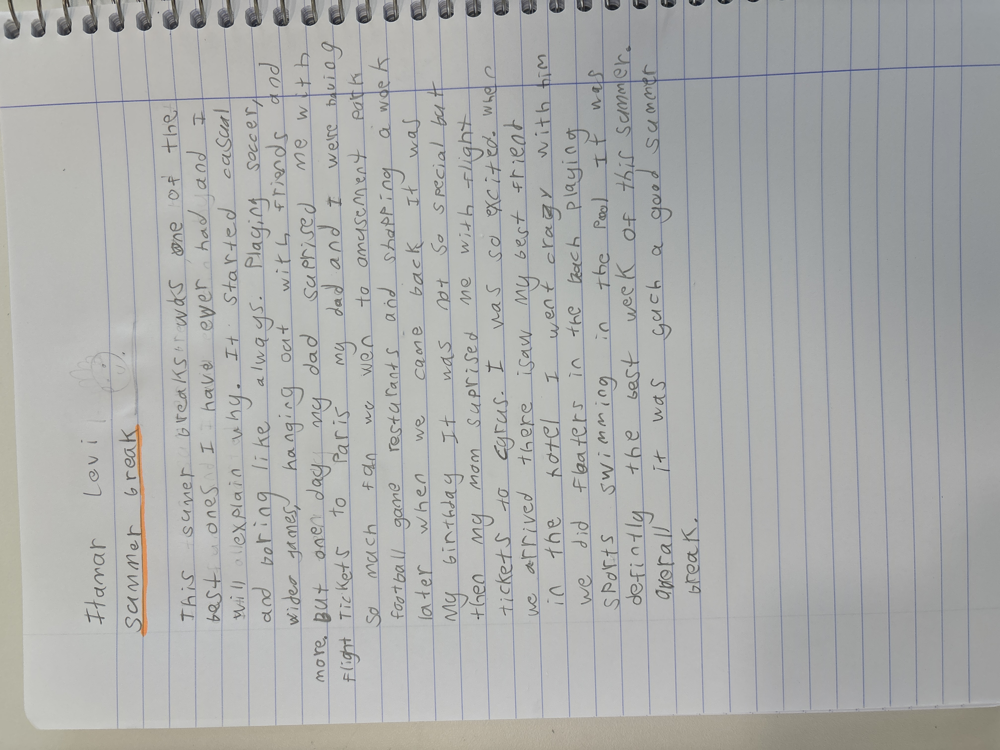

== OCR ==
Hamah Levi
Summer break
This summer break was one of the best
I experience in years. My family and I went to
lexington, ky. It was very hot and we were having
a luxary stay at a hotel. My dad was playing
some video games, hanging out with friends and we went
to parks. My dad was dancing because more tickets to
the concert too. I don't want to fly so such
day was not bad. It was a nice break.
Later, when
we came back to the place, we had all game
consoles and a lot of stuff to do. There was
a special flight.
My fifth day, it was more exciting, we
went to the cietys. I saw my best friend in
the city so there was a crazy time with him.
We
did swiming in the best pool playing summer sports. It
was the best pool in the summer.
Off this summer, I
got a good summer break. 



== Evaluation ==
Hamah, 

This is a really great start to your writing!
It sounds like you had a wonderful and exciting summer
break filled with fun activities.  It's clear you have
a strong voice and you are a

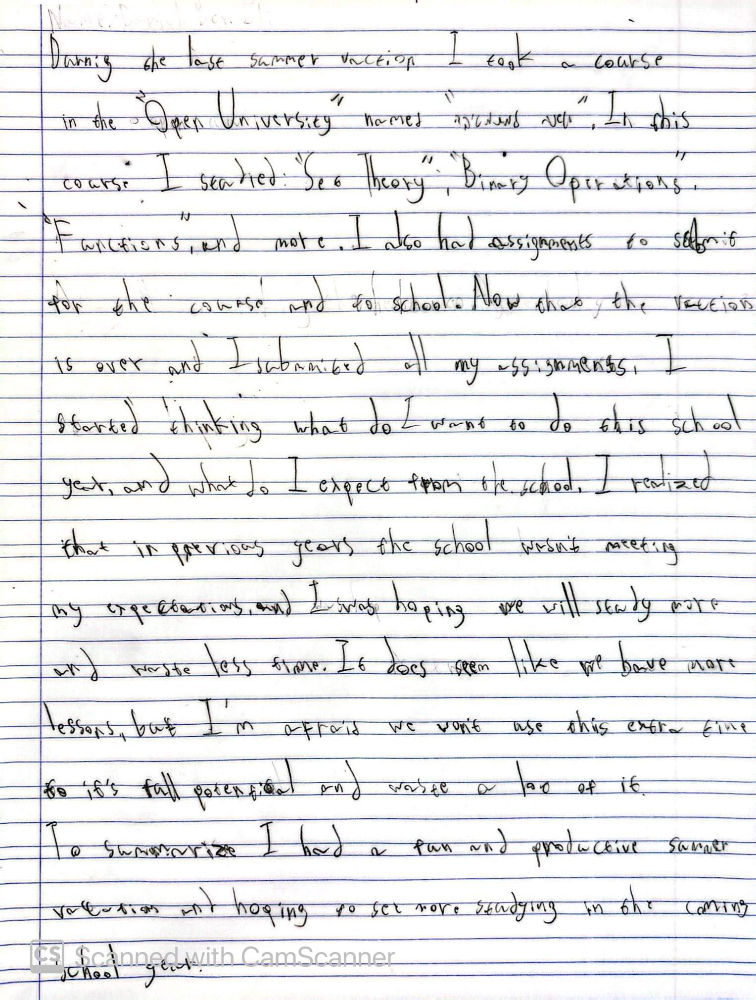

== OCR ==
During the last summer vacation I took a course in
the "Open University" named "studying new", In this course I
studied "Set theory" "Binary Operations", "Functions" and more. I also
had assignments to submit for the course and school. Now
that the vacation is over and I submitted all my
assignments, I started thinking what do I want to do
this school year, and what do I expect from the
school. I realized that in previous years the school wasn't
meeting my expectations and I was hoping we will study
more and waste less time. It does seem like we
have more lessons, but I'm afraid we won't use this
extra time to it's full potential and waste a lot
of it.

To summarize, I had a fun and productive summer
vacation and hoping to set more studying in the coming
school year. 




== Evaluation ==
This is a thoughtful reflection on your summer experiences and
your hopes for the upcoming school year. It's clear you're
a dedicated student who enjoys challenging themselves academically. 

In [ ]:
check_works(urls)

## Creating a new Google doc

In [ ]:
from google.oauth2 import service_account
from googleapiclient.discovery import build
from googleapiclient.discovery import build

# Load the service account credentials
SERVICE_ACCOUNT_FILE = 'path/to/credentials.json'
SCOPES = ['https://www.googleapis.com/auth/documents', 'https://www.googleapis.com/auth/drive.file']

creds = service_account.Credentials.from_service_account_file(SERVICE_ACCOUNT_FILE, scopes=SCOPES)

# Build the Google Docs and Google Drive service
docs_service = build('docs', 'v1', credentials=creds)
drive_service = build('drive', 'v3', credentials=creds)

# Create a new Google Doc
document = {
    'title': 'My New Document'
}
doc = docs_service.documents().create(body=document).execute()
doc_id = doc.get('documentId')

print(f'Created document with ID: {doc_id}')

# Define the text to be added
requests = [
    {
        'insertText': {
            'location': {
                'index': 1,
            },
            'text': 'Hello, this is some sample text added to the Google Doc!'
        }
    }
]

# Add text to the document
result = docs_service.documents().batchUpdate(documentId=doc_id, body={'requests': requests}).execute()

print('Text added successfully!')
